In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from palettable.colorbrewer.diverging import *
import plotly.express as px
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier,plot_tree;
from sklearn.preprocessing import LabelEncoder

In [2]:
# Reading the data
data = pd.read_csv('C:\\Users\\astth\\Downloads\\DS-ML Micromasters\\Course 1 - Python\\Week9\\globalterrorismdb_0718dist.csv',encoding='ISO-8859-1')

C:\Users\astth\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3072: DtypeWarning: Columns (4,6,31,33,61,62,63,76,79,90,92,94,96,114,115,121) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [3]:
# 135 Variables and 181691 Records
data.shape

(181691, 135)

In [4]:
# Checking the records
data.head()

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
4,197001000003,1970,1,0,NaN,0,NaN,101,Japan,4,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN


In [5]:
# All columns are not visible here. Note: in such cases, display.max_columns option is helpful   
data.columns

Index(['eventid', 'iyear', 'imonth', 'iday', 'approxdate', 'extended',
       'resolution', 'country', 'country_txt', 'region',
       ...
       'addnotes', 'scite1', 'scite2', 'scite3', 'dbsource', 'INT_LOG',
       'INT_IDEO', 'INT_MISC', 'INT_ANY', 'related'],
      dtype='object', length=135)

In [6]:
pd.set_option('display.max_columns', None)
data.head()

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,region_txt,provstate,city,latitude,longitude,specificity,vicinity,location,summary,crit1,crit2,crit3,doubtterr,alternative,alternative_txt,multiple,success,suicide,attacktype1,attacktype1_txt,attacktype2,attacktype2_txt,attacktype3,attacktype3_txt,targtype1,targtype1_txt,targsubtype1,targsubtype1_txt,corp1,target1,natlty1,natlty1_txt,targtype2,targtype2_txt,targsubtype2,targsubtype2_txt,corp2,target2,natlty2,natlty2_txt,targtype3,targtype3_txt,targsubtype3,targsubtype3_txt,corp3,target3,natlty3,natlty3_txt,gname,gsubname,gname2,gsubname2,gname3,gsubname3,motive,guncertain1,guncertain2,guncertain3,individual,nperps,nperpcap,claimed,claimmode,claimmode_txt,claim2,claimmode2,claimmode2_txt,claim3,claimmode3,claimmode3_txt,compclaim,weaptype1,weaptype1_txt,weapsubtype1,weapsubtype1_txt,weaptype2,weaptype2_txt,weapsubtype2,weapsubtype2_txt,weaptype3,weaptype3_txt,weapsubtype3,weapsubtype3_txt,weaptype4,weaptype4_txt,weapsubtype4,weapsubtype4_txt,weapdetail,nkill,nkillus,nkillter,nwound,nwoundus,nwoundte,property,propextent,propextent_txt,propvalue,propcomment,ishostkid,nhostkid,nhostkidus,nhours,ndays,divert,kidhijcountry,ransom,ransomamt,ransomamtus,ransompaid,ransompaidus,ransomnote,hostkidoutcome,hostkidoutcome_txt,nreleased,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,Central America & Caribbean,NaN,Santo Domingo,18.456792,-69.951164,1.0,0,NaN,NaN,1,1,1,0.0,NaN,NaN,0.0,1,0,1,Assassination,NaN,NaN,NaN,NaN,14,Private Citizens & Property,68.0,Named Civilian,NaN,Julio Guzman,58.0,Dominican Republic,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,MANO-D,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,North America,Federal,Mexico city,19.371887,-99.086624,1.0,0,NaN,NaN,1,1,1,0.0,NaN,NaN,0.0,1,0,6,Hostage Taking (Kidnapping),NaN,NaN,NaN,NaN,7,Government (Diplomatic),45.0,"Diplomatic Personnel (outside of embassy, cons...",Belgian Ambassador Daughter,"Nadine Chaval, daughter",21.0,Belgium,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23rd of September Communist League,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,1.0,1.0,0.0,NaN,NaN,NaN,Mexico,1.0,800000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,Southeast Asia,Tarlac,Unknown,15.478598,120.599741,4.0,0,NaN,NaN,1,1,1,0.0,NaN,NaN,0.0,1,0,1,Assassination,NaN,NaN,NaN,NaN,10,Journalists & Media,54.0,Radio Journalist/Staff/Facility,Voice of America,Employee,217.0,United States,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,Western Europe,Attica,Athens,37.997490,23.762728,1.0,0,NaN,NaN,1,1,1,0.0,NaN,NaN,0.0,1,0,3,Bombing/Explosion,NaN,NaN,NaN,NaN,7,Government (Diplomatic),46.0,Embassy/Consulate,NaN,U.S. Embassy,217.0,United States,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6,Explosives,16.0,Unknown Explosive Type,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Explosive,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN

**Certain useful features from the dataset such as the attack locations, date, geographical co-ordinates, type, victims, terrorist group, motive etc are extracted to create a sub-data frame.**   

In [7]:
attacks = data[['country_txt','region_txt','city','iyear','imonth','iday','latitude','longitude','attacktype1_txt','target1','nkill','nwound','summary','gname','targtype1_txt','weaptype1_txt','motive']]

In [8]:
# Checking if there are any null values
attacks.isnull().any()

country_txt        False
region_txt         False
city                True
iyear              False
imonth             False
iday               False
latitude            True
longitude           True
attacktype1_txt    False
target1             True
nkill               True
nwound              True
summary             True
gname              False
targtype1_txt      False
weaptype1_txt      False
motive              True
dtype: bool

In [9]:
# CHecking for the number of null values in each column.
attacks.isnull().sum()

country_txt             0
region_txt              0
city                  434
iyear                   0
imonth                  0
iday                    0
latitude             4556
longitude            4557
attacktype1_txt         0
target1               636
nkill               10313
nwound              16311
summary             66129
gname                   0
targtype1_txt           0
weaptype1_txt           0
motive             131130
dtype: int64

From the data above, it appears that the motive behind the attacks is not known most of the times. Trying to further decipher some statistics related to the attacks.

In [10]:
print(f'Number of countries in the dataset = {len(attacks.country_txt.unique())}')
print(f'Number of regions in the dataset = {len(attacks.region_txt.unique())}')
print(f'Range of the dataset : {attacks.iyear.min()} to {attacks.iyear.max()} ({attacks.iyear.max()-attacks.iyear.min()} years)')
print(f'Top 10 Countries with the highest number of terrorist attacks :')
print(attacks.country_txt.value_counts()[:10])

Number of countries in the dataset = 205
Number of regions in the dataset = 12
Range of the dataset : 1970 to 2017 (47 years)
Top 10 Countries with the highest number of terrorist attacks :
Iraq              24636
Pakistan          14368
Afghanistan       12731
India             11960
Colombia           8306
Philippines        6908
Peru               6096
El Salvador        5320
United Kingdom     5235
Turkey             4292
Name: country_txt, dtype: int64


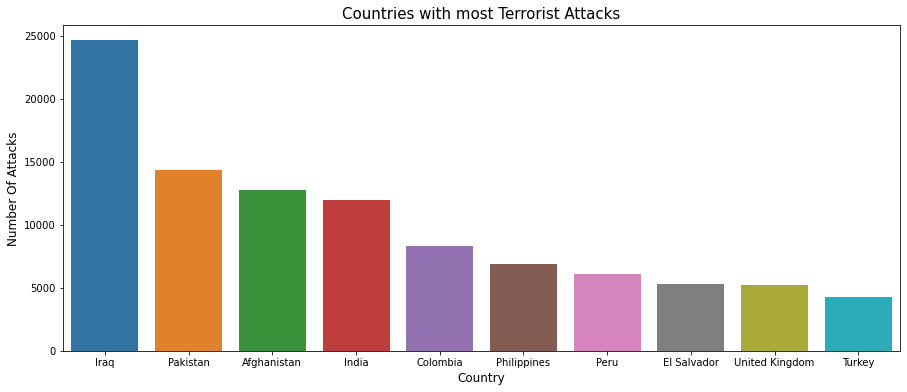

In [11]:
# Using a bar plot to visualize the countries with the most number of terrorist attacks

plt.subplots(figsize=(15,6))
country_vals = attacks.country_txt.value_counts()[:10]
country_vals = country_vals.reset_index() 
country_vals.columns=['Country','Number Of Attacks']
plt.title('Countries with most Terrorist Attacks',size=15)
plt.xlabel('Country',size=12)
plt.ylabel('Number Of Attacks',size=12)
sns.barplot(x=country_vals['Country'], y=country_vals['Number Of Attacks'])


In [12]:
attacks.head()

,country_txt,region_txt,city,iyear,imonth,iday,latitude,longitude,attacktype1_txt,target1,nkill,nwound,summary,gname,targtype1_txt,weaptype1_txt,motive
0,Dominican Republic,Central America & Caribbean,Santo Domingo,1970,7,2,18.456792,-69.951164,Assassination,Julio Guzman,1.0,0.0,NaN,MANO-D,Private Citizens & Property,Unknown,NaN
1,Mexico,North America,Mexico city,1970,0,0,19.371887,-99.086624,Hostage Taking (Kidnapping),"Nadine Chaval, daughter",0.0,0.0,NaN,23rd of September Communist League,Government (Diplomatic),Unknown,NaN
2,Philippines,Southeast Asia,Unknown,1970,1,0,15.478598,120.599741,Assassination,Employee,1.0,0.0,NaN,Unknown,Journalists & Media,Unknown,NaN
3,Greece,Western Europe,Athens,1970,1,0,37.997490,23.762728,Bombing/Explosion,U.S. Embassy,NaN,NaN,NaN,Unknown,Government (Diplomatic),Explosives,NaN
4,Japan,East Asia,Fukouka,1970,1,0,33.580412,130.396361,Facility/Infrastructure Attack,U.S. Consulate,NaN,NaN,NaN,Unknown,Government (Diplomatic),Incendiary,NaN


In [13]:
attacks.describe()

,iyear,imonth,iday,latitude,longitude,nkill,nwound
count,181691.000000,181691.000000,181691.000000,177135.000000,1.771340e+05,171378.000000,165380.000000
mean,2002.638997,6.467277,15.505644,23.498343,-4.586957e+02,2.403272,3.167668
std,13.259430,3.388303,8.814045,18.569242,2.047790e+05,11.545741,35.949392
min,1970.000000,0.000000,0.000000,-53.154613,-8.618590e+07,0.000000,0.000000
25%,1991.000000,4.000000,8.000000,11.510046,4.545640e+00,0.000000,0.000000
50%,2009.000000,6.000000,15.000000,31.467463,4.324651e+01,0.000000,0.000000
75%,2014.000000,9.000000,23.000000,34.685087,6.871033e+01,2.000000,2.000000
max,2017.000000,12.000000,31.000000,74.633553,1.793667e+02,1570.000000,8191.000000


In [14]:
# Filtering the dataset by extracting the terrorist attacks in India and cleaning by removing the records with unknown cities

attacks_in_India = attacks[(attacks['country_txt']=='India') & (attacks['city']!='Unknown')]

In [15]:
attacks_in_India.head()

,country_txt,region_txt,city,iyear,imonth,iday,latitude,longitude,attacktype1_txt,target1,nkill,nwound,summary,gname,targtype1_txt,weaptype1_txt,motive
1186,India,South Asia,New Delhi,1972,2,22,28.585836,77.153336,Hijacking,B-747,0.0,0.0,NaN,Palestinians,Airports & Aircraft,Explosives,NaN
2764,India,South Asia,Samastipur,1975,1,2,25.863042,85.781004,Bombing/Explosion,Lalit Narayan Mishra and a legislator,4.0,0.0,"1/2/1975: The Indian Railway Minister, Lalit N...",Ananda Marga,Government (General),Explosives,Unknown
3857,India,South Asia,New Delhi,1976,5,26,28.585836,77.153336,Bombing/Explosion,New Delhi airport,0.0,0.0,NaN,Unknown,Airports & Aircraft,Explosives,NaN
5327,India,South Asia,Bombay,1977,9,28,19.075984,72.877656,Hijacking,DC-8,0.0,0.0,NaN,Japanese Red Army (JRA),Airports & Aircraft,Firearms,NaN
7342,India,South Asia,Imphal,1979,1,14,24.798346,93.940430,Assassination,"Sudhir Kumar Singh, R.K. Sanajoaba Singh, Indr...",3.0,0.0,NaN,Unknown,Government (General),Firearms,NaN


In [16]:
attacks_in_India.groupby('city').count().sort_values(by='country_txt',ascending=False)

,country_txt,region_txt,iyear,imonth,iday,latitude,longitude,attacktype1_txt,target1,nkill,nwound,summary,gname,targtype1_txt,weaptype1_txt,motive
city,,,,,,,,,,,,,,,,
Srinagar,658,658,658,658,658,658,658,658,647,644,638,304,658,658,658,226
Imphal,426,426,426,426,426,426,426,426,426,423,422,405,426,426,426,255
New Delhi,157,157,157,157,157,157,157,157,150,156,150,43,157,157,157,38
Amritsar,138,138,138,138,138,138,138,138,138,135,135,3,138,138,138,3
Sopore,102,102,102,102,102,102,102,102,102,100,97,85,102,102,102,40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Jantri,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0
Japorigog,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
Jaram,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0


In [17]:
attacks_in_India.city.value_counts()[:10]

Srinagar            658
Imphal              426
New Delhi           157
Amritsar            138
Sopore              102
Ludhiana             77
Guwahati             77
Anantnag             76
Jammu                57
Latehar district     55
Name: city, dtype: int64

In [18]:
attacks_in_India['Victims']=attacks_in_India['nkill']+attacks_in_India['nwound']

C:\Users\astth\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [19]:
attacks_in_India.head()

,country_txt,region_txt,city,iyear,imonth,iday,latitude,longitude,attacktype1_txt,target1,nkill,nwound,summary,gname,targtype1_txt,weaptype1_txt,motive,Victims
1186,India,South Asia,New Delhi,1972,2,22,28.585836,77.153336,Hijacking,B-747,0.0,0.0,NaN,Palestinians,Airports & Aircraft,Explosives,NaN,0.0
2764,India,South Asia,Samastipur,1975,1,2,25.863042,85.781004,Bombing/Explosion,Lalit Narayan Mishra and a legislator,4.0,0.0,"1/2/1975: The Indian Railway Minister, Lalit N...",Ananda Marga,Government (General),Explosives,Unknown,4.0
3857,India,South Asia,New Delhi,1976,5,26,28.585836,77.153336,Bombing/Explosion,New Delhi airport,0.0,0.0,NaN,Unknown,Airports & Aircraft,Explosives,NaN,0.0
5327,India,South Asia,Bombay,1977,9,28,19.075984,72.877656,Hijacking,DC-8,0.0,0.0,NaN,Japanese Red Army (JRA),Airports & Aircraft,Firearms,NaN,0.0
7342,India,South Asia,Imphal,1979,1,14,24.798346,93.940430,Assassination,"Sudhir Kumar Singh, R.K. Sanajoaba Singh, Indr...",3.0,0.0,NaN,Unknown,Government (General),Firearms,NaN,3.0


In [20]:
attacks_in_India.groupby('city').sum()['Victims'].sort_values()[-10:]

city
Pulwama       391.0
Anantnag      487.0
Hyderabad     538.0
Imphal        603.0
Amritsar      768.0
Guwahati      812.0
Jammu        1111.0
New Delhi    2011.0
Mumbai       2016.0
Srinagar     3075.0
Name: Victims, dtype: float64

In [21]:
victims_counts_by_city  = pd.DataFrame(attacks_in_India.groupby('city').sum()['Victims'].sort_values()[-10:]).reset_index()
attack_counts_by_city = pd.DataFrame(attacks_in_India.city.value_counts()[:10]).reset_index()

In [22]:
victims_counts_by_city

,city,Victims
0,Pulwama,391.0
1,Anantnag,487.0
2,Hyderabad,538.0
3,Imphal,603.0
4,Amritsar,768.0
5,Guwahati,812.0
6,Jammu,1111.0
7,New Delhi,2011.0
8,Mumbai,2016.0
9,Srinagar,3075.0


In [23]:
attack_counts_by_city

,index,city
0,Srinagar,658
1,Imphal,426
2,New Delhi,157
3,Amritsar,138
4,Sopore,102
5,Ludhiana,77
6,Guwahati,77
7,Anantnag,76
8,Jammu,57
9,Latehar district,55


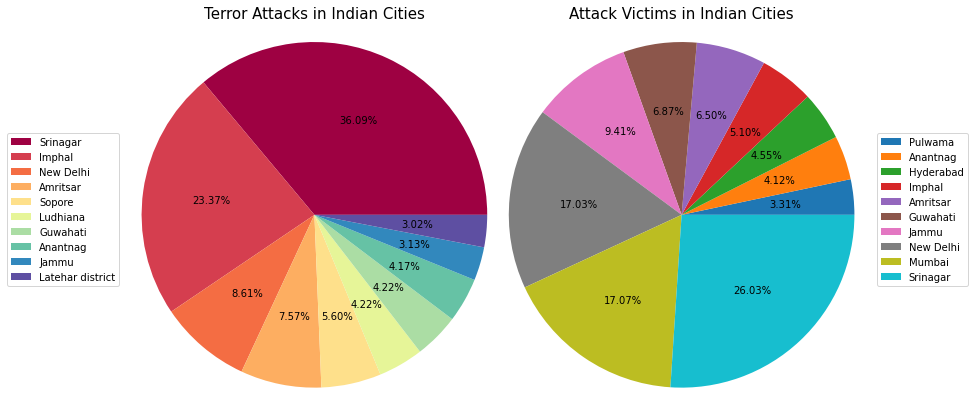

In [24]:
# Plotting two pie charts to visualize the Indian cities with most number of attacks and attack victims

colors = Spectral_10.mpl_colors
fig = plt.figure()
ax1 = fig.add_axes([0, 0, .6, .6], aspect=1)
ax1.pie(attack_counts_by_city.city,colors=colors,autopct='%1.2f%%',radius=2.5)
ax1.legend(labels=attack_counts_by_city['index'],bbox_to_anchor=(-0.6,1))
ax1.set_title('Terror Attacks in Indian Cities',y=1.6,size=15)
ax2 = fig.add_axes([.85, 0, .6, .6], aspect=1)
ax2.pie(victims_counts_by_city.Victims,autopct='%1.2f%%',radius=2.5)
ax2.set_title('Attack Victims in Indian Cities',y=1.6,size=15)
ax2.legend(labels=victims_counts_by_city['city'],bbox_to_anchor=(1.6,1))

It can be observed from the above chart that Srinagar city has the highest number of terror attacks among the cities in India and it also ranks the highest in the number of casualties caused by terror attacks from 1970 to 2017. Further, we will try to plot the attacks in India on a geographical map using the geospatial co-ordinates in the dataset. 

In [25]:
# Cleaning the dataset by dropping the null values in geospatial co-ordinates
attacks_in_India.dropna(subset=['latitude','longitude'],inplace=True)

C:\Users\astth\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [26]:
attacks_in_India.head()

,country_txt,region_txt,city,iyear,imonth,iday,latitude,longitude,attacktype1_txt,target1,nkill,nwound,summary,gname,targtype1_txt,weaptype1_txt,motive,Victims
1186,India,South Asia,New Delhi,1972,2,22,28.585836,77.153336,Hijacking,B-747,0.0,0.0,NaN,Palestinians,Airports & Aircraft,Explosives,NaN,0.0
2764,India,South Asia,Samastipur,1975,1,2,25.863042,85.781004,Bombing/Explosion,Lalit Narayan Mishra and a legislator,4.0,0.0,"1/2/1975: The Indian Railway Minister, Lalit N...",Ananda Marga,Government (General),Explosives,Unknown,4.0
3857,India,South Asia,New Delhi,1976,5,26,28.585836,77.153336,Bombing/Explosion,New Delhi airport,0.0,0.0,NaN,Unknown,Airports & Aircraft,Explosives,NaN,0.0
5327,India,South Asia,Bombay,1977,9,28,19.075984,72.877656,Hijacking,DC-8,0.0,0.0,NaN,Japanese Red Army (JRA),Airports & Aircraft,Firearms,NaN,0.0
7342,India,South Asia,Imphal,1979,1,14,24.798346,93.940430,Assassination,"Sudhir Kumar Singh, R.K. Sanajoaba Singh, Indr...",3.0,0.0,NaN,Unknown,Government (General),Firearms,NaN,3.0


In [27]:
# Creating a geographical plot using folium to visualize the areas with the most number of attacks in India

mapping = None 
coordinates = list(zip(attacks_in_India.latitude.values[:],attacks_in_India.longitude.values[:]))
mapping = folium.Map(location=[22,79],width=800,height=700,zoom_start=4.49,min_zoom=2,control_scale=True)
def plot_coordinate(coord):
    #print(coord[0],coord[1])
    folium.CircleMarker(location=[coord[0],coord[1]],
                        radius=1,
                        weight=5,color='red').add_to(mapping)
for coord in coordinates:
    plot_coordinate(coord)
mapping

From the above map, it is quite evident that in India, the highest number of terror attacks have happened in the northern and north-eastern parts of the country. From the earlier pie charts, Srinagar city which had the highest number of terror attacks and casualties is located in north of India which further supports the claim.  

In [28]:
attacks.attacktype1_txt.unique()

array(['Assassination', 'Hostage Taking (Kidnapping)',
       'Bombing/Explosion', 'Facility/Infrastructure Attack',
       'Armed Assault', 'Hijacking', 'Unknown', 'Unarmed Assault',
       'Hostage Taking (Barricade Incident)'], dtype=object)

In [29]:
attacks.country_txt.unique()

array(['Dominican Republic', 'Mexico', 'Philippines', 'Greece', 'Japan',
       'United States', 'Uruguay', 'Italy', 'East Germany (GDR)',
       'Ethiopia', 'Guatemala', 'Venezuela', 'West Germany (FRG)',
       'Switzerland', 'Jordan', 'Spain', 'Brazil', 'Egypt', 'Argentina',
       'Lebanon', 'Ireland', 'Turkey', 'Paraguay', 'Iran',
       'United Kingdom', 'Colombia', 'Bolivia', 'Nicaragua',
       'Netherlands', 'Belgium', 'Canada', 'Australia', 'Pakistan',
       'Zambia', 'Sweden', 'Costa Rica', 'South Yemen', 'Cambodia',
       'Israel', 'Poland', 'Taiwan', 'Panama', 'Kuwait',
       'West Bank and Gaza Strip', 'Austria', 'Czechoslovakia', 'India',
       'France', 'South Vietnam', 'Brunei', 'Zaire',
       "People's Republic of the Congo", 'Portugal', 'Algeria',
       'El Salvador', 'Thailand', 'Haiti', 'Sudan', 'Morocco', 'Cyprus',
       'Myanmar', 'Afghanistan', 'Peru', 'Chile', 'Honduras',
       'Yugoslavia', 'Ecuador', 'New Zealand', 'Malaysia', 'Singapore',
       'Bot

In [30]:
attacks.groupby(['iyear','attacktype1_txt']).count()

country_txt  region_txt  city  \
iyear attacktype1_txt                                                      
1970  Armed Assault                                 61          61    61   
      Assassination                                 22          22    22   
      Bombing/Explosion                            333         333   333   
      Facility/Infrastructure Attack               174         174   174   
      Hijacking                                     11          11    11   
...                                                ...         ...   ...   
2017  Hijacking                                     58          58    58   
      Hostage Taking (Barricade Incident)           82          82    82   
      Hostage Taking (Kidnapping)                  878         878   878   
      Unarmed Assault                              101         101   101   
      Unknown                                      825         825   825   

                                           imonth  iday  latitude  longitude  \
iyear attacktype1_txt                                                          
1970  Armed Assault                            61    61        61         61   
      Assassination                            22    22        21         21   
      Bombing/Explosion                       333   333       332        332   
      Facility/Infrastructure Attack          174   174       174        174   
      Hijacking                                11    11        11         11   
...                                           ...   ...       ...        ...   
2017  Hijacking                                58    58        58         58   
      Hostage Taking (Barricade Incident)      82    82        82         82   
      Hostage Taking (Kidnapping)             878   878       871        871   
      Unarmed Assault                         101   101       101        101   
      Unknown                                 825   825       819        819   

                                           target1  nkill  nwound  summary  \
iyear attacktype1_txt                                                        
1970  Armed Assault                             60     51      42       23   
      Assassination                             22     22      22        7   
      Bombing/Explosion                        316    315     313      209   
      Facility/Infrastructure Attack           170    165     165      145   
      Hijacking                                 11     11      11        1   
...                                            ...    ...     ...      ...   
2017  Hijacking                                 58     48      46       58   
      Hostage Taking (Barricade Incident)       82     80      71       82   
      Hostage Taking (Kidnapping)              878    583     519      878   
      Unarmed Assault                          101    101      80      101   
      Unknown                                  825    717     710      825   

                                           gname  targtype1_txt  \
iyear attacktype1_txt                                             
1970  Armed Assault                           61             61   
      Assassination                           22             22   
      Bombing/Explosion                      333            333   
      Facility/Infrastructure Attack         174            174   
      Hijacking                               11             11   
...                                          ...            ...   
2017  Hijacking                               58             58   
      Hostage Taking (Barricade Incident)     82             82   
      Hostage Taking (Kidnapping)            878            878   
      Unarmed Assault                        101            101   
      Unknown                                825            825   

                                           weaptype1_txt  motive  
iyear attacktype1_txt                                      

In [31]:
mask = [
    'Iraq'           
    ,'Pakistan'   
    ,'Afghanistan'
    ,'India'             
    ,'Colombia'           
    ,'Philippines'        
    ,'Peru'               
    ,'El Salvador' 
    ,'United Kingdom'
    ,'Turkey']
countries_with_most_attacks = attacks[attacks.country_txt.str.contains('|'.join(mask))]

In [32]:
countries_with_most_attacks.country_txt.unique()

array(['Philippines', 'Turkey', 'United Kingdom', 'Colombia', 'Pakistan',
       'India', 'El Salvador', 'Afghanistan', 'Peru', 'Iraq'],
      dtype=object)

In [33]:
countries_with_most_attacks = countries_with_most_attacks.groupby(['iyear','country_txt','attacktype1_txt']).count().reset_index()
countries_with_most_attacks=countries_with_most_attacks.rename(columns={"iyear": "Year", "country_txt": "Country", "attacktype1_txt": "Attack Type","city":"count"})
countries_with_most_attacks

,Year,Country,Attack Type,region_txt,count,imonth,iday,latitude,longitude,target1,nkill,nwound,summary,gname,targtype1_txt,weaptype1_txt,motive
0,1970,Colombia,Hostage Taking (Kidnapping),1,1,1,1,1,1,1,0,0,0,1,1,1,0
1,1970,Pakistan,Assassination,1,1,1,1,1,1,1,1,1,0,1,1,1,0
2,1970,Philippines,Assassination,1,1,1,1,1,1,1,1,1,0,1,1,1,0
3,1970,Philippines,Bombing/Explosion,6,6,6,6,5,5,6,6,6,0,6,6,6,0
4,1970,Philippines,Unknown,3,3,3,3,3,3,3,3,3,0,3,3,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2134,2017,United Kingdom,Bombing/Explosion,37,37,37,37,37,37,37,37,37,37,37,37,37,4
2135,2017,United Kingdom,Facility/Infrastructure Attack,40,40,40,40,40,40,40,40,40,40,40,40,40,7
2136,2017,United Kingdom,Hijacking,1,1,1,1,1,1,1,1,1,1,1,1,1,0
2137,2017,United Kingdom,Hostage Taking (Kidnapping),1,1,1,1,1,1,1,1,1,1,1,1,1,0


In [34]:
'''
Creating a 2D scatter plot using plotly.express module
Dimension 1: Year on X-axis
Dimension 2: Country on Y-axis (only top 10 countries with most terrorist attacks considered)
Additional Information is conveyed by the radius of the mark which is the number of attacks grouped by attack type.
For eg: In Iraq, the highest number of attacks is by Bombing/Explosion. 
'''

fig = px.scatter(countries_with_most_attacks, x="Year", y="Country",size="count", color="Attack Type",
                  log_x=True, size_max=60)
fig.show()

In [35]:
attacks

,country_txt,region_txt,city,iyear,imonth,iday,latitude,longitude,attacktype1_txt,target1,nkill,nwound,summary,gname,targtype1_txt,weaptype1_txt,motive
0,Dominican Republic,Central America & Caribbean,Santo Domingo,1970,7,2,18.456792,-69.951164,Assassination,Julio Guzman,1.0,0.0,NaN,MANO-D,Private Citizens & Property,Unknown,NaN
1,Mexico,North America,Mexico city,1970,0,0,19.371887,-99.086624,Hostage Taking (Kidnapping),"Nadine Chaval, daughter",0.0,0.0,NaN,23rd of September Communist League,Government (Diplomatic),Unknown,NaN
2,Philippines,Southeast Asia,Unknown,1970,1,0,15.478598,120.599741,Assassination,Employee,1.0,0.0,NaN,Unknown,Journalists & Media,Unknown,NaN
3,Greece,Western Europe,Athens,1970,1,0,37.997490,23.762728,Bombing/Explosion,U.S. Embassy,NaN,NaN,NaN,Unknown,Government (Diplomatic),Explosives,NaN
4,Japan,East Asia,Fukouka,1970,1,0,33.580412,130.396361,Facility/Infrastructure Attack,U.S. Consulate,NaN,NaN,NaN,Unknown,Government (Diplomatic),Incendiary,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181686,Somalia,Sub-Saharan Africa,Ceelka Geelow,2017,12,31,2.359673,45.385034,Armed Assault,Checkpoint,1.0,2.0,12/31/2017: Assailants opened fire on a Somali...,Al-Shabaab,Military,Firearms,NaN
181687,Syria,Middle East & North Africa,Jableh,2017,12,31,35.407278,35.942679,Bombing/Explosion,Hmeymim Air Base,2.0,7.0,12/31/2017: Assailants launched mortars at the...,Muslim extremists,Military,Explosives,NaN
181688,Philippines,Southeast Asia,Kubentog,2017,12,31,6.900742,124.437908,Facility/Infrastructure Attack,Houses,0.0,0.0,12/31/2017: Assailants set fire to houses in K...,Bangsamoro Islamic Freedom Movement (BIFM),Private Citizens & Property,Incendiary,NaN
181689,India,South Asia,Imphal,2017,12,31,24.798346,93.940430,Bombing/Explosion,Office,0.0,0.0,12/31/2017: Assailants threw a grenade at a Fo...,Unknown,Government (General),Explosives,NaN


In [36]:
attacks

,country_txt,region_txt,city,iyear,imonth,iday,latitude,longitude,attacktype1_txt,target1,nkill,nwound,summary,gname,targtype1_txt,weaptype1_txt,motive
0,Dominican Republic,Central America & Caribbean,Santo Domingo,1970,7,2,18.456792,-69.951164,Assassination,Julio Guzman,1.0,0.0,NaN,MANO-D,Private Citizens & Property,Unknown,NaN
1,Mexico,North America,Mexico city,1970,0,0,19.371887,-99.086624,Hostage Taking (Kidnapping),"Nadine Chaval, daughter",0.0,0.0,NaN,23rd of September Communist League,Government (Diplomatic),Unknown,NaN
2,Philippines,Southeast Asia,Unknown,1970,1,0,15.478598,120.599741,Assassination,Employee,1.0,0.0,NaN,Unknown,Journalists & Media,Unknown,NaN
3,Greece,Western Europe,Athens,1970,1,0,37.997490,23.762728,Bombing/Explosion,U.S. Embassy,NaN,NaN,NaN,Unknown,Government (Diplomatic),Explosives,NaN
4,Japan,East Asia,Fukouka,1970,1,0,33.580412,130.396361,Facility/Infrastructure Attack,U.S. Consulate,NaN,NaN,NaN,Unknown,Government (Diplomatic),Incendiary,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181686,Somalia,Sub-Saharan Africa,Ceelka Geelow,2017,12,31,2.359673,45.385034,Armed Assault,Checkpoint,1.0,2.0,12/31/2017: Assailants opened fire on a Somali...,Al-Shabaab,Military,Firearms,NaN
181687,Syria,Middle East & North Africa,Jableh,2017,12,31,35.407278,35.942679,Bombing/Explosion,Hmeymim Air Base,2.0,7.0,12/31/2017: Assailants launched mortars at the...,Muslim extremists,Military,Explosives,NaN
181688,Philippines,Southeast Asia,Kubentog,2017,12,31,6.900742,124.437908,Facility/Infrastructure Attack,Houses,0.0,0.0,12/31/2017: Assailants set fire to houses in K...,Bangsamoro Islamic Freedom Movement (BIFM),Private Citizens & Property,Incendiary,NaN
181689,India,South Asia,Imphal,2017,12,31,24.798346,93.940430,Bombing/Explosion,Office,0.0,0.0,12/31/2017: Assailants threw a grenade at a Fo...,Unknown,Government (General),Explosives,NaN


In [37]:
attacks.isnull().any()

country_txt        False
region_txt         False
city                True
iyear              False
imonth             False
iday               False
latitude            True
longitude           True
attacktype1_txt    False
target1             True
nkill               True
nwound              True
summary             True
gname              False
targtype1_txt      False
weaptype1_txt      False
motive              True
dtype: bool

In [38]:
cleaned_attacks_data=attacks.dropna(subset=['motive']).copy()

In [39]:
cleaned_attacks_data

,country_txt,region_txt,city,iyear,imonth,iday,latitude,longitude,attacktype1_txt,target1,nkill,nwound,summary,gname,targtype1_txt,weaptype1_txt,motive
5,United States,North America,Cairo,1970,1,1,37.005105,-89.176269,Armed Assault,Cairo Police Headquarters,0.0,0.0,1/1/1970: Unknown African American assailants ...,Black Nationalists,Police,Firearms,To protest the Cairo Illinois Police Deparment
8,United States,North America,Madison,1970,1,2,43.076592,-89.412488,Facility/Infrastructure Attack,"R.O.T.C. offices at University of Wisconsin, M...",0.0,0.0,"1/2/1970: Karl Armstrong, a member of the New ...",New Year's Gang,Military,Incendiary,To protest the War in Vietnam and the draft
9,United States,North America,Madison,1970,1,3,43.072950,-89.386694,Facility/Infrastructure Attack,Selective Service Headquarters in Madison Wisc...,0.0,0.0,"1/3/1970: Karl Armstrong, a member of the New ...",New Year's Gang,Government (General),Incendiary,To protest the War in Vietnam and the draft
11,United States,North America,Denver,1970,1,6,39.758968,-104.876305,Facility/Infrastructure Attack,"Army Recruiting Station, Denver Colorado",0.0,0.0,1/6/1970: Unknown perpetrators threw a Molotov...,Left-Wing Militants,Military,Incendiary,Protest the draft and Vietnam War
14,United States,North America,Rio Piedras,1970,1,9,18.386932,-66.061127,Facility/Infrastructure Attack,Baker's Store,0.0,0.0,1/9/1970: The Armed Commandos of Liberation c...,Armed Commandos of Liberation,Business,Incendiary,To protest United States owned businesses in P...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181663,India,South Asia,Koothuparamba,2017,12,30,11.831902,75.565432,Bombing/Explosion,Koothuparamba Police Station,0.0,0.0,12/30/2017: Assailants threw an explosive devi...,Unknown,Police,Explosives,"The specific motive is unknown; however, sourc..."
181665,India,South Asia,Toylanka,2017,12,30,18.802725,81.497666,Facility/Infrastructure Attack,Road Construction Site,0.0,0.0,12/30/2017: Assailants set fire to seven vehic...,Communist Party of India - Maoist (CPI-Maoist),Business,Firearms,"The specific motive is unknown; however, sourc..."
181672,India,South Asia,Lethapora,2017,12,31,33.966527,74.964225,Armed Assault,Camp,8.0,3.0,12/31/2017: Assailants armed with grenades and...,Jaish-e-Mohammad (JeM),Police,Explosives,"The specific motive is unknown; however, sourc..."
181682,Italy,Western Europe,Spinetoli,2017,12,31,42.888982,13.772795,Facility/Infrastructure Attack,Migrant Center,0.0,0.0,12/31/2017: Assailants set fire to a migrants'...,Unknown,Private Citizens & Property,Incendiary,"The specific motive is unknown; however, sourc..."


In [40]:
'''
Since the features are categorical and not numeric, hence we need to import LabelEncoder from scikit-learn
preprocessing module to assign a unique numeric label to values in each columns and also to the class which we are 
trying to predict.
'''   
label_encoder = LabelEncoder()

In [41]:
cleaned_attacks_data['country_label']=label_encoder.fit_transform(cleaned_attacks_data['country_txt'])
cleaned_attacks_data['attack_type_label']=label_encoder.fit_transform(cleaned_attacks_data['attacktype1_txt'])
cleaned_attacks_data['target_type_label']=label_encoder.fit_transform(cleaned_attacks_data['targtype1_txt'])
cleaned_attacks_data['weapon_type_label']=label_encoder.fit_transform(cleaned_attacks_data['weaptype1_txt'])
cleaned_attacks_data['motive_label']=label_encoder.fit_transform(cleaned_attacks_data['motive'])
cleaned_attacks_data['group_label']=label_encoder.fit_transform(cleaned_attacks_data['gname'])

In [42]:
features=['country_label','attack_type_label','target_type_label','weapon_type_label','motive_label']
X=cleaned_attacks_data[features].copy() 

In [43]:
X

,country_label,attack_type_label,target_type_label,weapon_type_label,motive_label
5,154,0,12,4,14018
8,154,3,9,5,14039
9,154,3,6,5,14039
11,154,3,9,5,2490
14,154,3,2,5,13979
...,...,...,...,...,...
181663,62,2,12,2,12524
181665,62,3,2,4,11928
181672,62,0,12,2,11960
181682,69,3,13,5,9608


In [44]:
y=pd.DataFrame(cleaned_attacks_data['group_label'])

In [45]:
y

,group_label
5,305
8,959
9,959
11,775
14,222
...,...
181663,1385
181665,361
181672,660
181682,1385


In [46]:
# Partioning the dataset into training and test sets. 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=300)

In [47]:
X_train

,country_label,attack_type_label,target_type_label,weapon_type_label,motive_label
106503,122,8,18,10,12403
133896,41,2,18,2,11076
79402,144,0,13,4,14279
98328,62,0,6,4,6290
92716,62,2,13,2,6290
...,...,...,...,...,...
96379,113,2,6,2,6290
73581,119,2,9,2,14279
106749,148,2,13,2,9292
73060,62,2,18,2,14279


In [48]:
X_test

,country_label,attack_type_label,target_type_label,weapon_type_label,motive_label
119324,62,0,13,6,8108
92525,0,2,13,2,6290
160505,35,8,9,10,10709
122055,144,2,2,2,7789
82117,134,2,12,2,14279
...,...,...,...,...,...
96885,66,2,6,2,6201
159000,62,6,13,4,2000
99336,66,2,18,2,6290
80078,66,0,2,4,14279


In [49]:
y_train

,group_label
106503,871
133896,892
79402,1385
98328,361
92716,1385
...,...
96379,1385
73581,334
106749,1385
73060,660


In [50]:
y_test

,group_label
119324,362
92525,1267
160505,975
122055,1385
82117,784
...,...
96885,1385
159000,825
99336,1385
80078,1385


In [51]:
# Training phase
group_classifier = DecisionTreeClassifier(max_leaf_nodes=1500, random_state=0)
group_classifier.fit(X_train, y_train)

DecisionTreeClassifier(max_leaf_nodes=1500, random_state=0)

In [52]:
# Testing phase
classifications = group_classifier.predict(X_test)

In [53]:
classifications[:10]

array([ 825, 1385, 1012, 1385,  784,  156, 1385,  927, 1267, 1385])

In [54]:
y_test[:10]

,group_label
119324,362
92525,1267
160505,975
122055,1385
82117,784
121315,1385
79677,80
69958,1385
82172,1267
89843,1385


In [55]:
# Computing the accuracy of the classifier model
accuracy_score(y_true = y_test, y_pred = classifications)

0.6709816612729234

Text(0.5, 1.0, 'Accuracy = 67.098%')

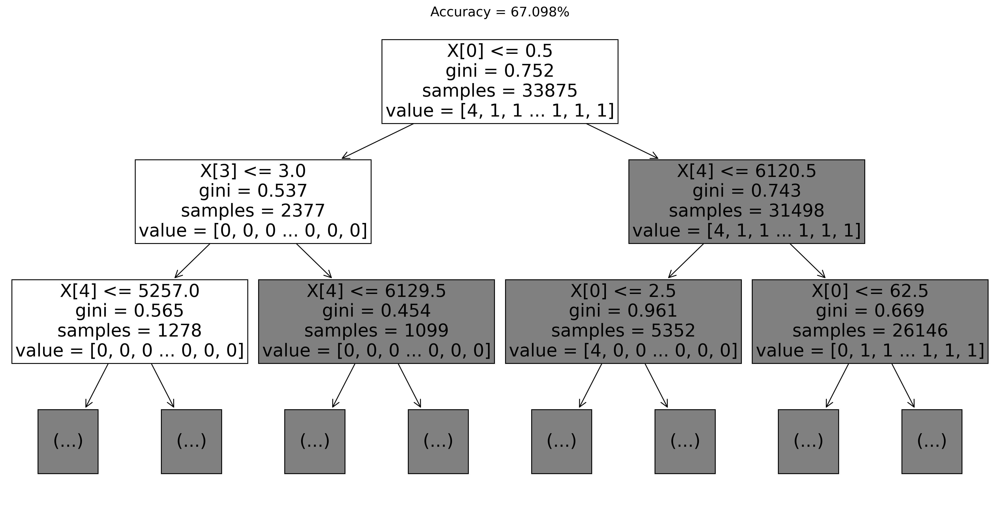

In [56]:
# Plotting a portion of the decision tree
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (20,10), dpi=300)
plot_tree(group_classifier,max_depth=2,fontsize=20)
plt.title(f'Accuracy = {accuracy_score(y_true = y_test, y_pred = classifications)*100:.3f}%',fontsize=15)